In [28]:
## Preparing Dataset
import pandas as pd 
import seaborn as sns
import numpy  as np 
import matplotlib.pyplot as plt 

%matplotlib inline

In [29]:
df = pd.read_csv('../../single_family_home_values.csv')
df.head(10)

,id,address,city,state,zipcode,latitude,longitude,bedrooms,bathrooms,rooms,squareFootage,lotSize,yearBuilt,lastSaleDate,lastSaleAmount,priorSaleDate,priorSaleAmount,estimated_value
0,39525749,8171 E 84th Ave,Denver,CO,80022,39.849160,-104.893468,3,2.0,6,1378,9968,2003.0,2009-12-17,75000,2004-05-13,165700.0,239753
1,184578398,10556 Wheeling St,Denver,CO,80022,39.888020,-104.830930,2,2.0,6,1653,6970,2004.0,2004-09-23,216935,NaN,NaN,343963
2,184430015,3190 Wadsworth Blvd,Denver,CO,80033,39.761710,-105.081070,3,1.0,0,1882,23875,1917.0,2008-04-03,330000,NaN,NaN,488840
3,155129946,3040 Wadsworth Blvd,Denver,CO,80033,39.760780,-105.081060,4,3.0,0,2400,11500,1956.0,2008-12-02,185000,2008-06-27,0.0,494073
4,245107,5615 S Eaton St,Denver,CO,80123,39.616181,-105.058812,3,4.0,8,2305,5600,1998.0,2012-07-18,308000,2011-12-29,0.0,513676
5,3523925,6535 W Sumac Ave,Denver,CO,80123,39.615136,-105.069018,3,5.0,7,2051,6045,1996.0,2006-09-12,363500,2005-05-16,339000.0,496062
6,30560679,6673 W Berry Ave,Denver,CO,80123,39.616350,-105.070760,4,4.0,8,2051,6315,1997.0,2014-12-15,420000,2006-07-07,345000.0,514953
7,39623928,5640 S Otis St,Denver,CO,80123,39.615213,-105.070617,3,3.0,7,2051,8133,1997.0,2004-03-15,328700,1998-04-09,225200.0,494321
8,148975825,5342 S Gray St,Denver,CO,80123,39.620158,-105.063094,3,3.0,7,1796,5038,1999.0,2011-08-16,274900,2011-01-10,0.0,496079
9,184623176,4967 S Wadsworth Blvd,Denver,CO,80123,39.626770,-105.081990,3,3.0,0,2054,4050,2007.0,2015-12-01,407000,2012-10-30,312000.0,424514


In [30]:
# Count of row and table
df.shape

(15000, 18)

In [31]:
# Show metadata of a data frame
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15000 entries, 0 to 14999
Data columns (total 18 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   id               15000 non-null  int64  
 1   address          15000 non-null  object 
 2   city             15000 non-null  object 
 3   state            15000 non-null  object 
 4   zipcode          15000 non-null  int64  
 5   latitude         14985 non-null  float64
 6   longitude        14985 non-null  float64
 7   bedrooms         15000 non-null  int64  
 8   bathrooms        15000 non-null  float64
 9   rooms            15000 non-null  int64  
 10  squareFootage    15000 non-null  int64  
 11  lotSize          15000 non-null  int64  
 12  yearBuilt        14999 non-null  float64
 13  lastSaleDate     15000 non-null  object 
 14  lastSaleAmount   15000 non-null  int64  
 15  priorSaleDate    11173 non-null  object 
 16  priorSaleAmount  11287 non-null  float64
 17  estimated_va

In [32]:
# Describe the dataframe
df.describe()

,id,zipcode,latitude,longitude,bedrooms,bathrooms,rooms,squareFootage,lotSize,yearBuilt,lastSaleAmount,priorSaleAmount,estimated_value
count,1.500000e+04,15000.000000,14985.000000,14985.000000,15000.000000,15000.000000,15000.000000,15000.000000,15000.00000,14999.000000,1.500000e+04,1.128700e+04,1.500000e+04
mean,5.176229e+07,80204.919467,39.740538,-104.964076,2.708400,2.195067,6.164133,1514.504400,5820.76620,1929.517168,4.053563e+05,2.594350e+05,6.371625e+05
std,6.190876e+07,9.715263,0.023555,0.039788,0.897231,1.166279,1.958601,830.635999,3013.27947,29.937051,7.756998e+05,3.379387e+05,5.044185e+05
min,1.433670e+05,80022.000000,39.614531,-105.108440,0.000000,0.000000,0.000000,350.000000,278.00000,1874.000000,2.590000e+02,0.000000e+00,1.477670e+05
25%,1.004802e+07,80205.000000,39.727634,-104.978737,2.000000,1.000000,5.000000,986.000000,4620.00000,1907.000000,1.940000e+05,1.100000e+05,3.984348e+05
50%,2.563241e+07,80206.000000,39.748048,-104.957689,3.000000,2.000000,6.000000,1267.500000,5950.00000,1925.000000,3.200000e+05,2.100000e+05,5.183575e+05
75%,5.114222e+07,80207.000000,39.758214,-104.937522,3.000000,3.000000,7.000000,1766.250000,6270.00000,1949.000000,4.632000e+05,3.302400e+05,6.879692e+05
max,3.209481e+08,80209.000000,39.888020,-104.830930,15.000000,12.000000,39.000000,10907.000000,122839.00000,2016.000000,4.560000e+07,1.600000e+07,1.014531e+07


In [33]:
# Solve Missing Value

# Fill with 0
filled_df = df.fillna(0)
filled_df.info() 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15000 entries, 0 to 14999
Data columns (total 18 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   id               15000 non-null  int64  
 1   address          15000 non-null  object 
 2   city             15000 non-null  object 
 3   state            15000 non-null  object 
 4   zipcode          15000 non-null  int64  
 5   latitude         15000 non-null  float64
 6   longitude        15000 non-null  float64
 7   bedrooms         15000 non-null  int64  
 8   bathrooms        15000 non-null  float64
 9   rooms            15000 non-null  int64  
 10  squareFootage    15000 non-null  int64  
 11  lotSize          15000 non-null  int64  
 12  yearBuilt        15000 non-null  float64
 13  lastSaleDate     15000 non-null  object 
 14  lastSaleAmount   15000 non-null  int64  
 15  priorSaleDate    15000 non-null  object 
 16  priorSaleAmount  15000 non-null  float64
 17  estimated_va

In [34]:
# Fill missing value with Mean
mean_df = df.fillna(df.mean())
mean_df.info()
mean_df.head(10)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15000 entries, 0 to 14999
Data columns (total 18 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   id               15000 non-null  int64  
 1   address          15000 non-null  object 
 2   city             15000 non-null  object 
 3   state            15000 non-null  object 
 4   zipcode          15000 non-null  int64  
 5   latitude         15000 non-null  float64
 6   longitude        15000 non-null  float64
 7   bedrooms         15000 non-null  int64  
 8   bathrooms        15000 non-null  float64
 9   rooms            15000 non-null  int64  
 10  squareFootage    15000 non-null  int64  
 11  lotSize          15000 non-null  int64  
 12  yearBuilt        15000 non-null  float64
 13  lastSaleDate     15000 non-null  object 
 14  lastSaleAmount   15000 non-null  int64  
 15  priorSaleDate    11173 non-null  object 
 16  priorSaleAmount  15000 non-null  float64
 17  estimated_va

,id,address,city,state,zipcode,latitude,longitude,bedrooms,bathrooms,rooms,squareFootage,lotSize,yearBuilt,lastSaleDate,lastSaleAmount,priorSaleDate,priorSaleAmount,estimated_value
0,39525749,8171 E 84th Ave,Denver,CO,80022,39.849160,-104.893468,3,2.0,6,1378,9968,2003.0,2009-12-17,75000,2004-05-13,165700.000000,239753
1,184578398,10556 Wheeling St,Denver,CO,80022,39.888020,-104.830930,2,2.0,6,1653,6970,2004.0,2004-09-23,216935,NaN,259435.014619,343963
2,184430015,3190 Wadsworth Blvd,Denver,CO,80033,39.761710,-105.081070,3,1.0,0,1882,23875,1917.0,2008-04-03,330000,NaN,259435.014619,488840
3,155129946,3040 Wadsworth Blvd,Denver,CO,80033,39.760780,-105.081060,4,3.0,0,2400,11500,1956.0,2008-12-02,185000,2008-06-27,0.000000,494073
4,245107,5615 S Eaton St,Denver,CO,80123,39.616181,-105.058812,3,4.0,8,2305,5600,1998.0,2012-07-18,308000,2011-12-29,0.000000,513676
5,3523925,6535 W Sumac Ave,Denver,CO,80123,39.615136,-105.069018,3,5.0,7,2051,6045,1996.0,2006-09-12,363500,2005-05-16,339000.000000,496062
6,30560679,6673 W Berry Ave,Denver,CO,80123,39.616350,-105.070760,4,4.0,8,2051,6315,1997.0,2014-12-15,420000,2006-07-07,345000.000000,514953
7,39623928,5640 S Otis St,Denver,CO,80123,39.615213,-105.070617,3,3.0,7,2051,8133,1997.0,2004-03-15,328700,1998-04-09,225200.000000,494321
8,148975825,5342 S Gray St,Denver,CO,80123,39.620158,-105.063094,3,3.0,7,1796,5038,1999.0,2011-08-16,274900,2011-01-10,0.000000,496079
9,184623176,4967 S Wadsworth Blvd,Denver,CO,80123,39.626770,-105.081990,3,3.0,0,2054,4050,2007.0,2015-12-01,407000,2012-10-30,312000.000000,424514


In [35]:
## Removing missing value
df.dropna(inplace=True)
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 11078 entries, 0 to 14999
Data columns (total 18 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   id               11078 non-null  int64  
 1   address          11078 non-null  object 
 2   city             11078 non-null  object 
 3   state            11078 non-null  object 
 4   zipcode          11078 non-null  int64  
 5   latitude         11078 non-null  float64
 6   longitude        11078 non-null  float64
 7   bedrooms         11078 non-null  int64  
 8   bathrooms        11078 non-null  float64
 9   rooms            11078 non-null  int64  
 10  squareFootage    11078 non-null  int64  
 11  lotSize          11078 non-null  int64  
 12  yearBuilt        11078 non-null  float64
 13  lastSaleDate     11078 non-null  object 
 14  lastSaleAmount   11078 non-null  int64  
 15  priorSaleDate    11078 non-null  object 
 16  priorSaleAmount  11078 non-null  float64
 17  estimated_va

In [36]:
# Calling Field
df.estimated_value # Single Column using . 
df['estimated_value'] # Single Column
df[['estimated_value','rooms']] # Multi Column
df[['estimated_value','rooms']].head(10) # Multi Column

,estimated_value,rooms
0,239753,6
3,494073,0
4,513676,8
5,496062,7
6,514953,8
7,494321,7
8,496079,7
9,424514,0
10,721350,7
11,331915,6


In [37]:
# Show Unique Value
df.zipcode.unique()

array([80022, 80033, 80123, 80202, 80203, 80204, 80205, 80206, 80207,
       80209])

/Users/harysetiawan/Documents/Work/study/env/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


<AxesSubplot:xlabel='estimated_value'>

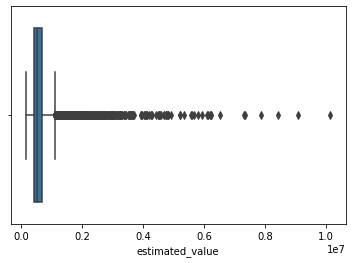

In [38]:
# Chek for Outlayer / Noise in data by showing in boxplot
sns.boxplot(df.estimated_value)

/Users/harysetiawan/Documents/Work/study/env/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


<AxesSubplot:xlabel='estimated_value'>

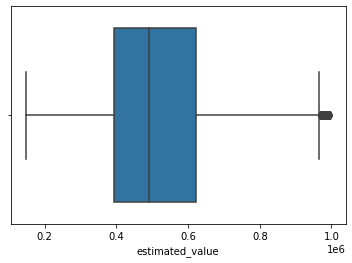

In [39]:
# Delete outlayer by filtering dataset with condition
df = df[df.estimated_value <= 1000000] # Filter falue according to the equalization
# Check if exist outlayer
sns.boxplot(df.estimated_value)

<AxesSubplot:>

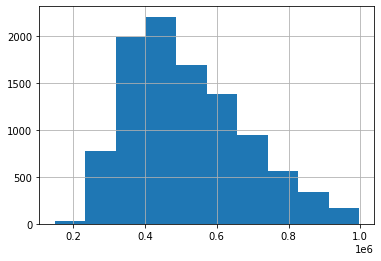

In [40]:
# Show Histogram
df.estimated_value.hist()

/Users/harysetiawan/Documents/Work/study/env/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


<AxesSubplot:xlabel='estimated_value'>

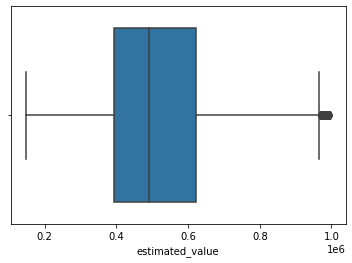

In [41]:
# More way multiple noise is by doing multi filter
df[(df.estimated_value<=1000000) & (df.yearBuilt> 2013) | (df.zipcode == 80209)]
# Display Data
sns.boxplot(df.estimated_value)

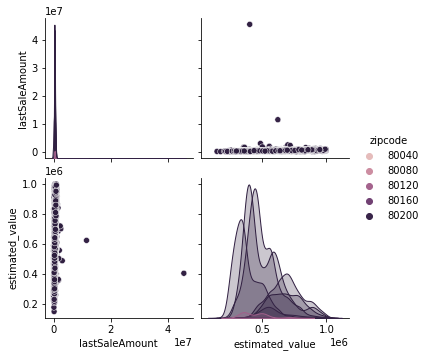

In [42]:
# Showing Correlation Between Data using Pair Plot 
# sns.pairplot(df[['lastSaleAmount','estimated_value','yearBuilt']]) # Show Pair Data in a plot
sns.pairplot(df[['lastSaleAmount','estimated_value','zipcode']],hue='zipcode') # Add Color bazed on zipcode 

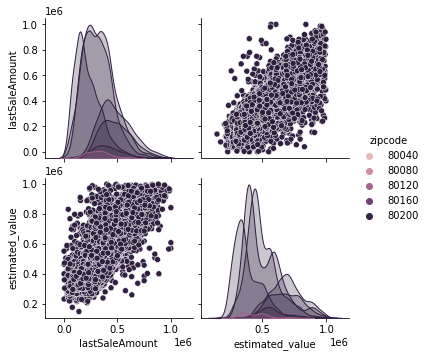

In [43]:
# More example of diagram
df = df[df.lastSaleAmount<=1000000]
sns.pairplot(df[['lastSaleAmount','estimated_value','zipcode']],hue='zipcode') # Add Color bazed on zipcode 

<AxesSubplot:xlabel='zipcode', ylabel='estimated_value'>

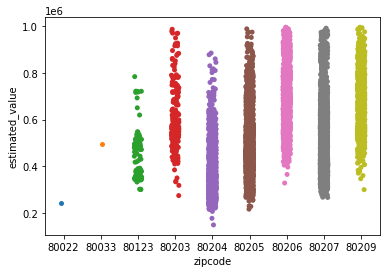

In [44]:
sns.stripplot(x=df.zipcode,y=df.estimated_value)

<AxesSubplot:xlabel='zipcode', ylabel='estimated_value'>

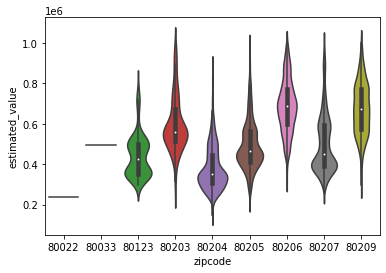

In [45]:
# Using violin plot
# Kind of blub ( kembung ) in the cart indicate that there are a lot of quantity (number) in corresponding index of a chart 
sns.violinplot(x=df.zipcode,y=df.estimated_value)

In [46]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 10056 entries, 0 to 14996
Data columns (total 18 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   id               10056 non-null  int64  
 1   address          10056 non-null  object 
 2   city             10056 non-null  object 
 3   state            10056 non-null  object 
 4   zipcode          10056 non-null  int64  
 5   latitude         10056 non-null  float64
 6   longitude        10056 non-null  float64
 7   bedrooms         10056 non-null  int64  
 8   bathrooms        10056 non-null  float64
 9   rooms            10056 non-null  int64  
 10  squareFootage    10056 non-null  int64  
 11  lotSize          10056 non-null  int64  
 12  yearBuilt        10056 non-null  float64
 13  lastSaleDate     10056 non-null  object 
 14  lastSaleAmount   10056 non-null  int64  
 15  priorSaleDate    10056 non-null  object 
 16  priorSaleAmount  10056 non-null  float64
 17  estimated_va

In [47]:
# Change Format
pd.to_datetime(df.lastSaleDate)
# Assign Falue to Column
df['lastSaleDate'] = pd.to_datetime(df.lastSaleDate)
df.priorSaleDate = pd.to_datetime(df.priorSaleDate)

In [48]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 10056 entries, 0 to 14996
Data columns (total 18 columns):
 #   Column           Non-Null Count  Dtype         
---  ------           --------------  -----         
 0   id               10056 non-null  int64         
 1   address          10056 non-null  object        
 2   city             10056 non-null  object        
 3   state            10056 non-null  object        
 4   zipcode          10056 non-null  int64         
 5   latitude         10056 non-null  float64       
 6   longitude        10056 non-null  float64       
 7   bedrooms         10056 non-null  int64         
 8   bathrooms        10056 non-null  float64       
 9   rooms            10056 non-null  int64         
 10  squareFootage    10056 non-null  int64         
 11  lotSize          10056 non-null  int64         
 12  yearBuilt        10056 non-null  float64       
 13  lastSaleDate     10056 non-null  datetime64[ns]
 14  lastSaleAmount   10056 non-null  int64

In [49]:
# Add new column after change data in to datetime
df.lastSaleDate.dt.weekday
df['weekday_lastSaleDate'] = df.lastSaleDate.dt.weekday 
df['year_lastSaleDate'] = df.lastSaleDate.dt.year

df['weekday_priorSaleDate'] = df.priorSaleDate.dt.weekday
df['year_priorSaleDate'] = df.priorSaleDate.dt.year

df['year_between_last_sales'] = df.year_lastSaleDate - df.year_priorSaleDate

In [50]:
df.head(2)

,id,address,city,state,zipcode,latitude,longitude,bedrooms,bathrooms,rooms,...,lastSaleDate,lastSaleAmount,priorSaleDate,priorSaleAmount,estimated_value,weekday_lastSaleDate,year_lastSaleDate,weekday_priorSaleDate,year_priorSaleDate,year_between_last_sales
0,39525749,8171 E 84th Ave,Denver,CO,80022,39.84916,-104.893468,3,2.0,6,...,2009-12-17,75000,2004-05-13,165700.0,239753,3,2009,3,2004,5
3,155129946,3040 Wadsworth Blvd,Denver,CO,80033,39.76078,-105.081060,4,3.0,0,...,2008-12-02,185000,2008-06-27,0.0,494073,1,2008,4,2008,0


In [51]:
# Actual Correlation
df.corr()

,id,zipcode,latitude,longitude,bedrooms,bathrooms,rooms,squareFootage,lotSize,yearBuilt,lastSaleAmount,priorSaleAmount,estimated_value,weekday_lastSaleDate,year_lastSaleDate,weekday_priorSaleDate,year_priorSaleDate,year_between_last_sales
id,1.000000,-0.011297,-0.048153,0.048387,0.039121,0.107386,0.054204,0.094452,-0.019166,-0.006153,0.235009,0.013557,0.151873,-0.001664,0.215965,0.017883,-0.041292,0.196563
zipcode,-0.011297,1.000000,0.526403,0.391642,-0.046614,-0.080346,-0.003405,-0.087891,-0.075253,-0.226559,0.065523,0.010375,0.109777,-0.003422,0.028791,-0.020472,0.032874,-0.012251
latitude,-0.048153,0.526403,1.000000,0.549132,-0.018614,-0.099648,-0.126971,-0.139466,0.027390,-0.009419,-0.197746,-0.208449,-0.199264,-0.012104,0.048474,-0.023184,0.119064,-0.084467
longitude,0.048387,0.391642,0.549132,1.000000,-0.000402,0.097216,-0.010909,0.027004,0.106275,0.070333,0.196856,0.153441,0.234486,-0.006020,0.039119,-0.016870,0.042747,-0.014722
bedrooms,0.039121,-0.046614,-0.018614,-0.000402,1.000000,0.415339,0.675945,0.652693,-0.016413,-0.129642,0.224836,0.138312,0.358081,0.005502,-0.013530,-0.025519,-0.022331,0.012653
bathrooms,0.107386,-0.080346,-0.099648,0.097216,0.415339,1.000000,0.549778,0.663715,-0.015200,-0.013998,0.506835,0.343256,0.651712,-0.002129,0.068560,-0.026412,0.055031,-0.005874
rooms,0.054204,-0.003405,-0.126971,-0.010909,0.675945,0.549778,1.000000,0.733533,-0.118596,-0.251359,0.396264,0.284077,0.582055,0.020427,-0.036699,-0.028701,-0.080663,0.054452
squareFootage,0.094452,-0.087891,-0.139466,0.027004,0.652693,0.663715,0.733533,1.000000,-0.047501,-0.190924,0.501981,0.333408,0.690419,0.003686,-0.008145,-0.017721,-0.081598,0.075907
lotSize,-0.019166,-0.075253,0.027390,0.106275,-0.016413,-0.015200,-0.118596,-0.047501,1.000000,0.460479,-0.068455,-0.049009,-0.074329,0.008917,-0.006770,0.003851,0.030610,-0.035535
yearBuilt,-0.006153,-0.226559,-0.009419,0.070333,-0.129642,-0.013998,-0.251359,-0.190924,0.460479,1.000000,-0.172716,-0.116049,-0.257927,-0.004976,0.028297,0.010283,0.065311,-0.045106


In [52]:
# Corrilation filtering based on column
df.corr().loc['estimated_value',:]
# Sorting Corraltion
df.corr().loc['estimated_value',:].sort_values(ascending=False)
# More better the correlation value, the more a data has correlation with another data

estimated_value            1.000000
lastSaleAmount             0.771199
squareFootage              0.690419
bathrooms                  0.651712
rooms                      0.582055
priorSaleAmount            0.570242
bedrooms                   0.358081
longitude                  0.234486
id                         0.151873
zipcode                    0.109777
year_between_last_sales    0.088621
year_lastSaleDate          0.040228
weekday_lastSaleDate       0.001672
weekday_priorSaleDate     -0.014823
year_priorSaleDate        -0.059596
lotSize                   -0.074329
latitude                  -0.199264
yearBuilt                 -0.257927
Name: estimated_value, dtype: float64

In [53]:
df.head(100).sort_values(by='year_between_last_sales',ascending=True)

,id,address,city,state,zipcode,latitude,longitude,bedrooms,bathrooms,rooms,...,lastSaleDate,lastSaleAmount,priorSaleDate,priorSaleAmount,estimated_value,weekday_lastSaleDate,year_lastSaleDate,weekday_priorSaleDate,year_priorSaleDate,year_between_last_sales
36,18197471,4977 S Garland St,Denver,CO,80123,39.626080,-105.103470,3,2.0,6,...,2017-06-08,312500,2017-05-12,258000.0,348079,3,2017,4,2017,0
102,184623174,4947 S Wadsworth Blvd,Denver,CO,80123,39.627030,-105.081990,3,3.0,0,...,2015-12-24,405000,2015-06-25,325000.0,461609,3,2015,3,2015,0
46,19150871,4756 S Perry St,Denver,CO,80123,39.630389,-105.038707,3,2.0,5,...,1999-12-14,153500,1999-12-14,153500.0,366187,1,1999,1,1999,0
123,13422838,5654 S Ingalls St,Denver,CO,80123,39.615608,-105.064810,4,3.0,9,...,2008-02-21,340000,2008-01-03,0.0,535801,3,2008,3,2008,0
23,39777745,4962 S Field Ct,Denver,CO,80123,39.625819,-105.099825,3,2.0,7,...,2016-12-02,328000,2016-08-02,231200.0,349041,4,2016,1,2016,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
144,184196331,7400 W Grant Ranch Blvd # 23,Denver,CO,80123,39.618440,-105.079900,2,2.0,5,...,2013-10-21,350000,1998-07-28,222700.0,485689,0,2013,1,1998,15
148,51514373,6700 W Dorado Dr # 2,Denver,CO,80123,39.614540,-105.071350,1,4.0,5,...,2015-07-09,627000,2000-01-12,368600.0,650683,3,2015,2,2000,15
77,46340060,9085 W Bellwood Pl,Denver,CO,80123,39.625018,-105.100617,3,2.0,6,...,2017-05-17,350000,2002-03-12,200000.0,352696,2,2017,1,2002,15
72,184340023,6900 W Grant Ranch Blvd # 82,Denver,CO,80123,39.618343,-105.077086,2,3.0,7,...,2016-05-23,455000,1999-08-03,291500.0,491508,0,2016,1,1999,17


In [104]:
# Show Mean of estimated value Group By zipcode
df.groupby('zipcode').estimated_value.mean()

# Show Max of estimated value Group By zipcode
df.groupby('zipcode').estimated_value.max()

# Show Min of estimated value Group By zipcode
df.groupby(['zipcode','yearBuilt']).estimated_value.min()

# Show Min of estimated value Group By zipcode
df.groupby(['zipcode','yearBuilt']).estimated_value.median().head(10).reset_index().sort_values(by='yearBuilt',ascending=False)

,zipcode,yearBuilt,estimated_value
0,80022,2003.0,239753.0
9,80123,1979.0,357373.0
8,80123,1978.0,350987.0
7,80123,1977.0,348776.0
6,80123,1964.0,377254.0
5,80123,1962.0,331915.0
4,80123,1961.0,348035.0
3,80123,1960.0,370857.0
2,80123,1959.0,378509.0
1,80033,1956.0,494073.0


In [99]:
# Merge 2 Daframe
df2 = df.groupby('zipcode').estimated_value.median().reset_index()
# Can be join like sql, in how params ==> left / inner (default) / right join
df3 = pd.merge(df,df2,on='zipcode',how='left')
df3.head(2)

,id,address,city,state,zipcode,latitude,longitude,bedrooms,bathrooms,rooms,...,lastSaleAmount,priorSaleDate,priorSaleAmount,estimated_value_x,weekday_lastSaleDate,year_lastSaleDate,weekday_priorSaleDate,year_priorSaleDate,year_between_last_sales,estimated_value_y
0,39525749,8171 E 84th Ave,Denver,CO,80022,39.84916,-104.893468,3,2.0,6,...,75000,2004-05-13,165700.0,239753,3,2009,3,2004,5,239753.0
1,155129946,3040 Wadsworth Blvd,Denver,CO,80033,39.76078,-105.081060,4,3.0,0,...,185000,2008-06-27,0.0,494073,1,2008,4,2008,0,494073.0


In [100]:
# Merge 2 Daframe 
df2 = df.groupby('zipcode').estimated_value.median().reset_index()
# Rename column so there is no prefix _x and _y in final result
df2.columns = ['zipcode','median_estimated_value']
# Can be join like sql, in how params ==> left / inner (default) / right join
df3 = pd.merge(df,df2,on='zipcode',how='left')
df3.head(2)

,id,address,city,state,zipcode,latitude,longitude,bedrooms,bathrooms,rooms,...,lastSaleAmount,priorSaleDate,priorSaleAmount,estimated_value,weekday_lastSaleDate,year_lastSaleDate,weekday_priorSaleDate,year_priorSaleDate,year_between_last_sales,median_estimated_value
0,39525749,8171 E 84th Ave,Denver,CO,80022,39.84916,-104.893468,3,2.0,6,...,75000,2004-05-13,165700.0,239753,3,2009,3,2004,5,239753.0
1,155129946,3040 Wadsworth Blvd,Denver,CO,80033,39.76078,-105.081060,4,3.0,0,...,185000,2008-06-27,0.0,494073,1,2008,4,2008,0,494073.0


In [103]:
# Drop Column
df.drop('estimated_value',axis=1)

,id,address,city,state,zipcode,latitude,longitude,bedrooms,bathrooms,rooms,...,yearBuilt,lastSaleDate,lastSaleAmount,priorSaleDate,priorSaleAmount,weekday_lastSaleDate,year_lastSaleDate,weekday_priorSaleDate,year_priorSaleDate,year_between_last_sales
0,39525749,8171 E 84th Ave,Denver,CO,80022,39.849160,-104.893468,3,2.0,6,...,2003.0,2009-12-17,75000,2004-05-13,165700.0,3,2009,3,2004,5
3,155129946,3040 Wadsworth Blvd,Denver,CO,80033,39.760780,-105.081060,4,3.0,0,...,1956.0,2008-12-02,185000,2008-06-27,0.0,1,2008,4,2008,0
4,245107,5615 S Eaton St,Denver,CO,80123,39.616181,-105.058812,3,4.0,8,...,1998.0,2012-07-18,308000,2011-12-29,0.0,2,2012,3,2011,1
5,3523925,6535 W Sumac Ave,Denver,CO,80123,39.615136,-105.069018,3,5.0,7,...,1996.0,2006-09-12,363500,2005-05-16,339000.0,1,2006,0,2005,1
6,30560679,6673 W Berry Ave,Denver,CO,80123,39.616350,-105.070760,4,4.0,8,...,1997.0,2014-12-15,420000,2006-07-07,345000.0,0,2014,4,2006,8
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14989,23766957,421 S Washington St,Denver,CO,80209,39.708869,-104.979540,2,2.0,6,...,1924.0,2008-07-08,385000,1998-01-30,182900.0,1,2008,4,1998,10
14990,4511745,255 S Downing St,Denver,CO,80209,39.711870,-104.973735,2,2.0,5,...,1910.0,2009-10-06,385000,2005-08-03,360000.0,1,2009,2,2005,4
14993,42985979,1016 S Emerson St,Denver,CO,80209,39.698090,-104.976608,3,2.0,6,...,1909.0,2017-05-31,600000,2013-06-07,535000.0,2,2017,4,2013,4
14994,150304831,376 S High St,Denver,CO,80209,39.709681,-104.964860,3,2.0,7,...,1925.0,2015-09-10,815000,1994-05-06,142000.0,3,2015,4,1994,21


In [101]:
# Sample Datasets
# Kggle = kaggle.compile
# Reddit = 
# Sklearn = 
# Google! = 